In [1]:
%reload_ext tensorboard
%tensorboard --logdir logs --port 6009

Reusing TensorBoard on port 6009 (pid 485689), started 2 days, 8:19:59 ago. (Use '!kill 485689' to kill it.)

In [2]:
from src.scripts.utils import get_test_loader, show_images, evaluate_model
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_dataloader = get_test_loader()

[INFO] Copying dataset 'mahmudulhaqueshawon/cat-image' to data/raw_data...
[INFO] Dataset ready at data/raw_data


In [3]:
import glob
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

In [4]:
files = [file for file in glob.glob(f'models/ssl/simclr/embeddings/*')]
results = []
for file in files:
    num_residual_layers = int(file.split('_')[3][-1])
    mask = True if float(file.split("_")[9][5:]) > 0.0 else False
    mlp_hidden_dim = int(file.split("_")[6][3:])
    tau = float('.'+file.split("_")[10][3:])*10
    val_loss = float(file.split("_")[-1][:-4])
    results.append({
        'num_residual_layers': num_residual_layers,
        'mask': mask,
        'mlp_hidden_dim': mlp_hidden_dim,
        'tau': tau,
        'val_loss': val_loss
    })
df = pd.DataFrame(results)

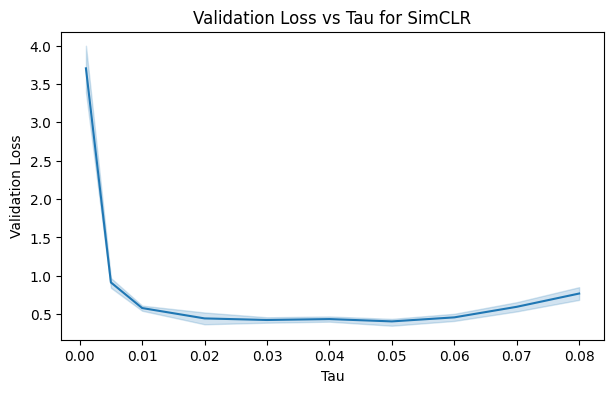

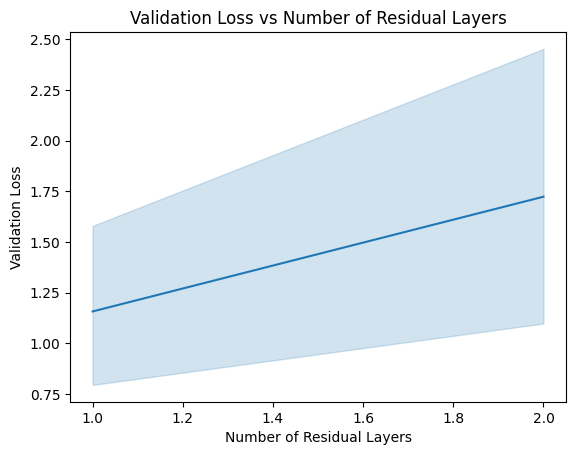

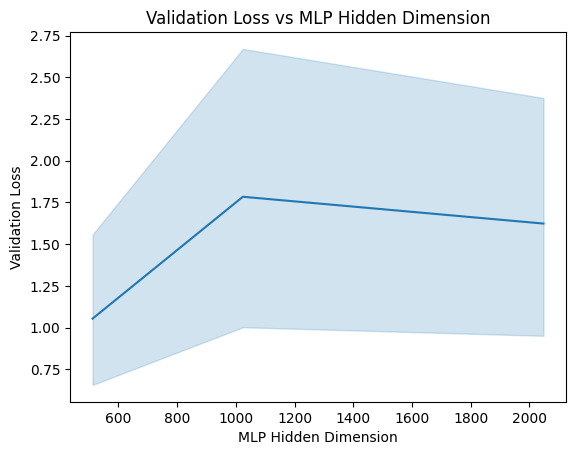

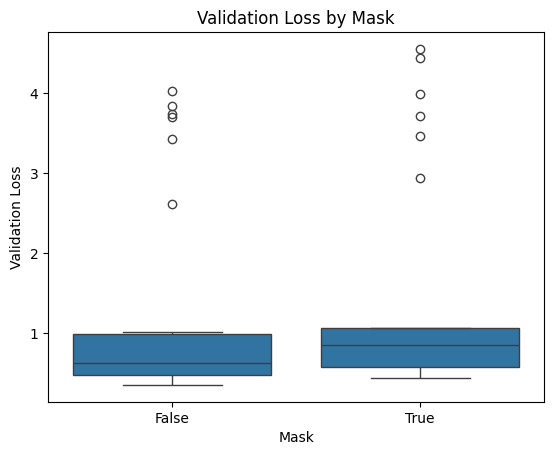

In [16]:
df = df[df['tau'] < 0.1]

plt.figure(figsize=(7, 4))

sns.lineplot(df, x='tau', y='val_loss')
plt.xlabel('Tau')
plt.ylabel('Validation Loss')
plt.title('Validation Loss vs Tau for SimCLR')
plt.show()

sns.lineplot(df, x='num_residual_layers', y='val_loss')
plt.xlabel('Number of Residual Layers')
plt.ylabel('Validation Loss')
plt.title('Validation Loss vs Number of Residual Layers')
plt.show()

sns.lineplot(df, x='mlp_hidden_dim', y='val_loss')
plt.xlabel('MLP Hidden Dimension')
plt.ylabel('Validation Loss')
plt.title('Validation Loss vs MLP Hidden Dimension')
plt.show()

sns.boxplot(df, x='mask', y='val_loss')
plt.xlabel('Mask')
plt.ylabel('Validation Loss')
plt.title('Validation Loss by Mask')
plt.show()

In [6]:
df.sort_values(by='val_loss').head(15)

,num_residual_layers,mask,mlp_hidden_dim,tau,val_loss
21,1,False,512,0.05,0.348621
49,1,False,512,0.02,0.367198
38,1,False,512,0.03,0.388021
36,1,False,512,0.04,0.401255
33,1,False,512,0.06,0.410824
41,1,False,512,0.05,0.428556
24,2,False,1024,0.01,0.428738
30,1,True,512,0.05,0.437790
40,1,True,512,0.03,0.458668
37,1,True,512,0.04,0.469284


In [7]:
df

,num_residual_layers,mask,mlp_hidden_dim,tau,val_loss
0,2,True,2048,0.005,0.920014
1,2,True,512,0.010,0.594923
2,2,False,2048,0.001,3.843664
3,1,False,512,0.010,0.600397
4,2,False,512,0.001,3.703756
5,1,True,2048,0.001,3.460513
6,2,False,512,0.010,0.532511
7,1,False,2048,0.005,0.894561
8,1,True,512,0.070,0.655247
9,1,True,2048,0.005,0.991816


In [8]:
file.split('_')

['models/ssl/simclr/embeddings/simclr',
 'num',
 'residual',
 'layers2',
 'mlp',
 'hidden',
 'dim1024',
 'mask',
 'size',
 'ratio00',
 'tau0001',
 'tsne',
 '4.028775.png']

In [9]:
2+2

4

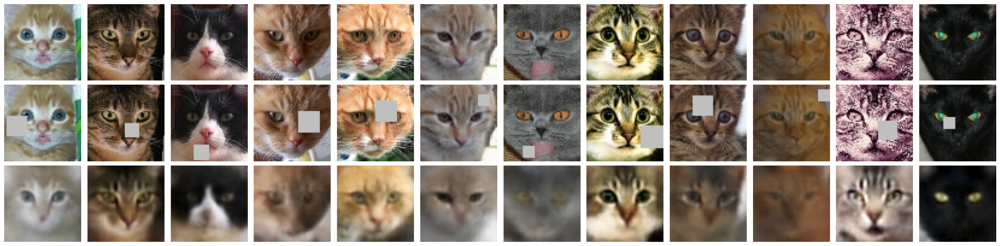

Test MSE: 0.0115
Test SSIM: 0.4659
Test PSNR: 19.8099


In [10]:
from src.models.vae.vae import VAE

model = VAE(
    input_dim=3,
    hidden_dim=128,
    residual_hiddens=64,
    num_residual_layers=1,
    latent_dim=1024,
)

model.load_state_dict(
    torch.load("models/reconstruction/vae-simclr/simclr_vae_layers_maskedFalse_tau0.001.pt", map_location=device)
)

model = model.to(device)

mask_img, clean_img = next(iter(test_dataloader))
mask_imgs = mask_img.to(device)
original_imgs = clean_img.to(device)

with torch.no_grad():
    reconstructed = model(mask_imgs)

show_images((original_imgs), (mask_imgs), (reconstructed["recon"]), n=12)
evaluate_model(model, test_dataloader, device)

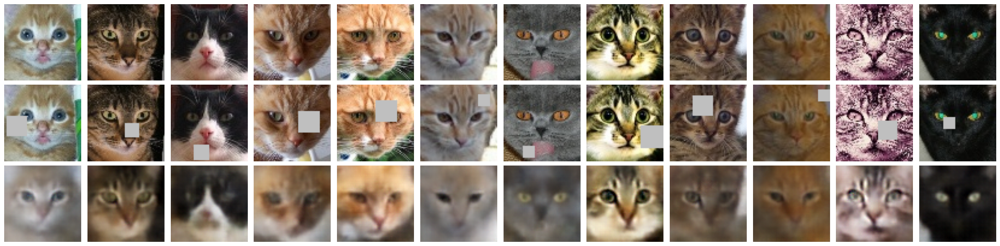

Test MSE: 0.0113
Test SSIM: 0.4736
Test PSNR: 19.9075


In [14]:
model = VAE(
    input_dim=3,
    hidden_dim=128,
    residual_hiddens=64,
    num_residual_layers=1,
    latent_dim=1024,
)

model.load_state_dict(
    torch.load("models/reconstruction/vae-simclr/simclr_vae_layers_maskedFalse_tau0.05.pt", map_location=device)
)

model = model.to(device)

mask_img, clean_img = next(iter(test_dataloader))
mask_imgs = mask_img.to(device)
original_imgs = clean_img.to(device)

with torch.no_grad():
    reconstructed = model(mask_imgs)

show_images((original_imgs), (mask_imgs), (reconstructed["recon"]), n=12)
evaluate_model(model, test_dataloader, device)

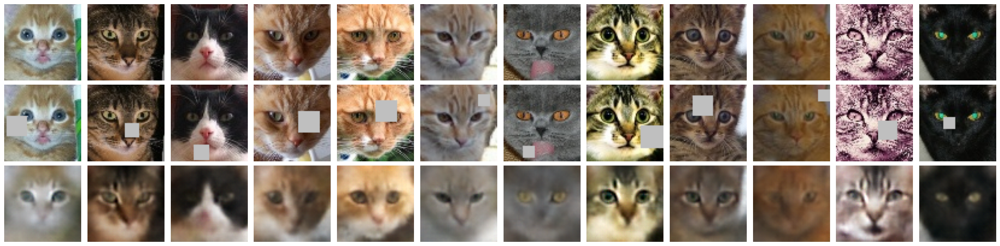

Test MSE: 0.0113
Test SSIM: 0.4682
Test PSNR: 19.9097


In [ ]:
model = VAE(
    input_dim=3,
    hidden_dim=128,
    residual_hiddens=64,
    num_residual_layers=1,
    latent_dim=1024,
)

model.load_state_dict(
    torch.load("models/reconstruction/vae-simclr/simclr_vae_layers_maskedTrue_tau0.001.pt", map_location=device)
)

model = model.to(device)

mask_img, clean_img = next(iter(test_dataloader))
mask_imgs = mask_img.to(device)
original_imgs = clean_img.to(device)

with torch.no_grad():
    reconstructed = model(mask_imgs)

show_images((original_imgs), (mask_imgs), (reconstructed["recon"]), n=12)
evaluate_model(model, test_dataloader, device)

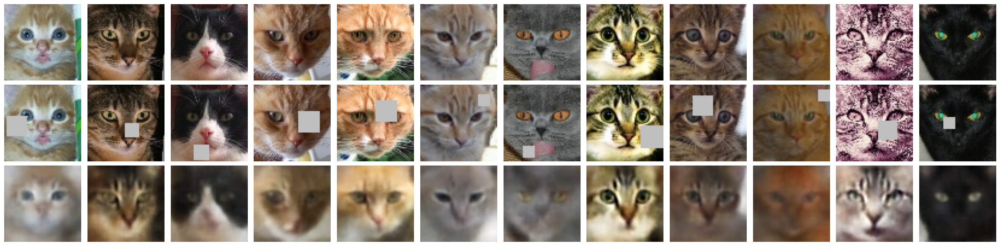

Test MSE: 0.0110
Test SSIM: 0.4776
Test PSNR: 20.0560


In [13]:
model = VAE(
    input_dim=3,
    hidden_dim=128,
    residual_hiddens=64,
    num_residual_layers=1,
    latent_dim=1024,
)

model.load_state_dict(
    torch.load("models/reconstruction/vae-simclr/simclr_vae_layers_maskedTrue_tau0.05.pt", map_location=device)
)

model = model.to(device)

mask_img, clean_img = next(iter(test_dataloader))
mask_imgs = mask_img.to(device)
original_imgs = clean_img.to(device)

with torch.no_grad():
    reconstructed = model(mask_imgs)

show_images((original_imgs), (mask_imgs), (reconstructed["recon"]), n=12)
evaluate_model(model, test_dataloader, device)

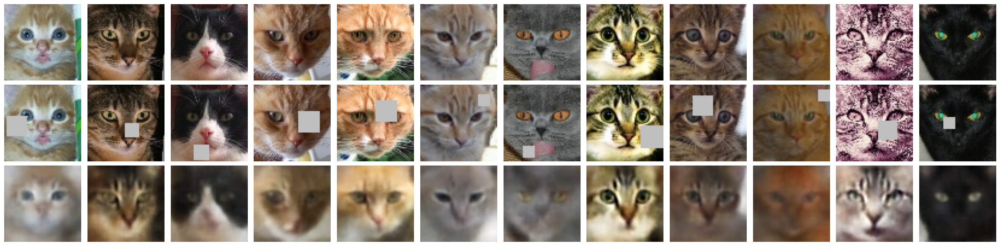

Test MSE: 0.0110
Test SSIM: 0.4776
Test PSNR: 20.0560


In [ ]:
model = VAE(
    input_dim=3,
    hidden_dim=128,
    residual_hiddens=64,
    num_residual_layers=1,
    latent_dim=1024,
)

model.load_state_dict(
    torch.load("models/reconstruction/vae-simclr/simclr_vae_layers_maskedTrue_tau0.05.pt", map_location=device)
)

model = model.to(device)

mask_img, clean_img = next(iter(test_dataloader))
mask_imgs = mask_img.to(device)
original_imgs = clean_img.to(device)

with torch.no_grad():
    reconstructed = model(mask_imgs)

show_images((original_imgs), (mask_imgs), (reconstructed["recon"]), n=12)
evaluate_model(model, test_dataloader, device)